# Исследование рынка заведений общественного питания Москвы <a class="anchor" id="s-bullet"></a>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Описание данных**

Мне предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


Файл ``moscow_places.csv``:

- ``name`` — название заведения;
- ``address`` — адрес заведения;
- ``category`` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- ``hours`` — информация о днях и часах работы;
- ``lat`` — широта географической точки, в которой находится заведение;
- ``lng`` — долгота географической точки, в которой находится заведение;
- ``rating`` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- ``price`` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- ``avg_bill`` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
      «Средний счёт: 1000–1500 ₽»;
      «Цена чашки капучино: 130–220 ₽»;
      «Цена бокала пива: 400–600 ₽».
      и так далее;
- ``middle_avg_bill`` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
       Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
       Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
       Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- ``middle_coffee_cup`` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
       Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
       Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
       Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- ``chain`` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
       0 — заведение не является сетевым
       1 — заведение является сетевым
- ``district`` — административный район, в котором находится заведение, например Центральный административный округ;
- ``seats`` — количество посадочных мест.



**Цель проекта:**

- подготовить исследование рынка Москвы, выявить интересные особенности , которые в будущем помогут в выборе подходящего инвесторам места для открытия кофейни.

**Ход исследования:**


**Шаг 1.** Обзор данных.


**Шаг 2.** Предобработка данных.


**Шаг 3.** Исследовательский анализ данных.


**Шаг 4.** Выводы и рекомендации по анализу заведений общественного питания Москвы.


**Шаг 5.** Детализация исследования: Открытие кофейни.


**Шаг 6.** Выводы и рекомендации по открытию кофейни.


**Шаг 7.** Создание презентации.

## Содержание проекта
* [**Загрузка и обзор данных**](#a-bullet)
* * [Итоги](#aa-bullet)    
* [**Предобработка данных**](#b-bullet)
* * [Поиск неявных дубликатов](#ba-bullet)
* * [Работа с пропущенными значениями](#bb-bullet)
* * [Добавление новых столбцов](#bc-bullet)
* * [Итоги](#bd-bullet)
* [**Исследовательский анализ данных**](#c-bullet)
* * [Распределение заведений по категориям](#ca-bullet)
* * [Зависимость количества посадочных мест от категорий](#cb-bullet)
* * [Соотношение сетевых и несетевых заведений](#cc-bullet)
* * [ТОП-15 популярных сетей в Москве](#cd-bullet)
* * [Распределение заведений (категорий) по административным районам](#ce-bullet)
* * [Распределение среднего рейтинга по категориям заведений](#cf-bullet)
* * [Картограмма со средним рейтингом заведений каждого района](#cg-bullet)
* * [Топ-15 улиц по количеству заведений](#ch-bullet)
* * [Улицы с одним заведением](#ci-bullet)
* * [Зависимость среднего счета от удаленности от центра](#cj-bullet)
* * [Зависимость часов работы заведений от категории и расположения](#ck-bullet)
* * [Особенности заведений с низким рейтингом](#cl-bullet)
* * [Выводы](#cm-bullet)
* [**Детализация исследования: Открытие кофейни**](#d-bullet)
* [**Выводы и рекомендации по открытию кофейни**](#e-bullet)

## Загрузка и общий обзор данных <a class="anchor" id="a-bullet"></a>

In [1]:
# импортируем необходимые библиотеки

import pandas as pd
import numpy as np
import math as mth
import missingno as msno

import matplotlib.pyplot as plt

import seaborn as sns
import plotly.express as px
import plotly.io as pio

from plotly import graph_objects as go

import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json

In [2]:
#функция для вывода общей информации
def genetal_info(data):
     return print('Первые 10 строк датафрейма:'), \
    display(data.head(10)), \
    print('Информация о датафрейме:'), \
    display(data.info()), \
    print('Размер датафрейма:'), \
    display(data.shape), \
    print('Название столбцов:'), \
    display(data.columns), \
    print('Количество явных дубликатов:'), \
    display(data.duplicated().sum()), \
    print('Процент пропущенных значений:'), \
    display(pd.DataFrame(data.isna().mean()*100).style.set_precision(1).background_gradient('coolwarm')), \
    print('Визуализация пропусков:'), \
    display(msno.matrix(data, labels=True))

In [3]:
try:
    df = pd.read_csv('datasets/moscow_places.csv')
except:
    df = pd.read_csv('moscow_places.csv')

Первые 10 строк датафрейма:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Размер датафрейма:


(8406, 14)

Название столбцов:


Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

Количество явных дубликатов:


0

Процент пропущенных значений:


,0
name,0.0
category,0.0
address,0.0
district,0.0
hours,6.4
lat,0.0
lng,0.0
rating,0.0
price,60.6
avg_bill,54.6


Визуализация пропусков:


<Axes: >

(None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None)

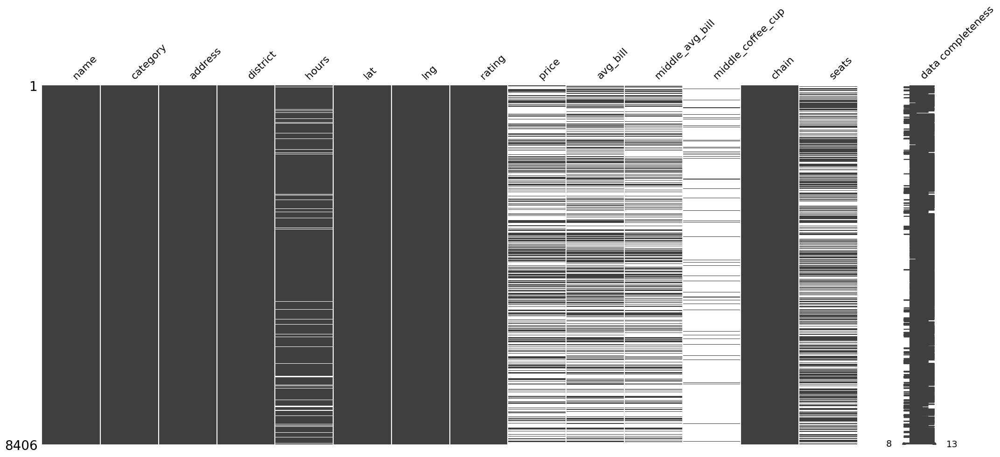

In [4]:
genetal_info(df)

### Итоги <a class="anchor" id="aa-bullet"></a>

<div style="border:solid pink 3px; padding: 20px">

**В ходе загрузки и обзора данных:**
    
1. найдено 8406 строк в таблице (заведений общественного питания). Необходимо проверить датасест на наличие неявных дубликатов.    
2. явных дубликатов не было обнаружено.
3. обнаружено, что все названия столбцов соответстуют snake_case.
4. обнаружено, что типы данных значений в столбцах корректны.
4. найдены пропущенные значения в столбцах, их доля от всего датафрейма:
    - ``hours`` - 6.4% пропущенных значений 
    - ``price`` - 60.6% пропущенных значений
    - ``avg_bill`` - 54.6% пропущенных значений
    - ``middle_avg_bill`` - 62.5% пропущенных значений
    - ``middle_coffee_cup`` - 93.6% пропущенных значений
    - ``seats`` - 43.0% пропущенных значений
    
Пропуски в столбцах ``middle_avg_bill`` и ``middle_coffee_cup`` обусловлены тем, что эти данные основаны на данных из столбца ``avg_bill``, в котором и так 54.6% пропусков.
Что касается других столбцов: ``avg_bill``, ``hours``, ``price``, ``seats``, то нужно будет посмотреть на коэффициент корреляции с другими столбцами и , если это возможно, заполнить пропуски.

## Предобрабока данных <a class="anchor" id="b-bullet"></a>

### Поиск неявных дубликатов <a class="anchor" id="ba-bullet"></a>

In [5]:
print('Количество уникальных названий заведений:', df['name'].nunique())
#приведем названия к нижнему регистру 
df['name'] = df['name'].str.lower()
print('Количество уникальных названий заведений:', df['name'].nunique())

Количество уникальных названий заведений: 5614
Количество уникальных названий заведений: 5512


In [6]:
print('Количество явных дубликатов:', df.duplicated().sum())

Количество явных дубликатов: 0


In [7]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [9]:
df['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [10]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [11]:
print('Количество неявных дубликатов:', df[['name', 'address']].duplicated().sum())

Количество неявных дубликатов: 3


In [12]:
#посмотрим на строки с неявными дубликатами
df[df[['name', 'address']].duplicated() == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Найдем и удалим дубликаты с меньшим набором данных:

In [13]:
df[df['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [14]:
df[df['name'] == 'раковарня клешни и хвосты']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


In [15]:
df[df['name'] == 'хлеб да выпечка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


In [16]:
#удаляем дубликаты
df = df.drop(index=[1430, 2211, 3109]).reset_index(drop=True)

In [17]:
df[['name', 'address']].duplicated().sum()

0

### Работа с пропущенными значениями <a class="anchor" id="bb-bullet"></a>

In [18]:
df.corr()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
lat,1.000000,-0.129479,0.028306,-0.006489,-0.001345,-0.017093,-0.022654
lng,-0.129479,1.000000,-0.017202,-0.052662,-0.038006,-0.047192,-0.088207
rating,0.028306,-0.017202,1.000000,0.183238,0.100447,-0.014954,0.021109
middle_avg_bill,-0.006489,-0.052662,0.183238,1.000000,NaN,-0.128766,0.082429
middle_coffee_cup,-0.001345,-0.038006,0.100447,NaN,1.000000,-0.028641,-0.025197
chain,-0.017093,-0.047192,-0.014954,-0.128766,-0.028641,1.000000,0.042396
seats,-0.022654,-0.088207,0.021109,0.082429,-0.025197,0.042396,1.000000


Корреляция значений столбцов очень слабая.

In [19]:
df[['avg_bill', 'middle_coffee_cup', 'middle_avg_bill', 'hours', 'price', 'seats']].sample(10)

,avg_bill,middle_coffee_cup,middle_avg_bill,hours,price,seats
6356,NaN,NaN,NaN,"ежедневно, 10:00–22:00",средние,250.0
8331,Средний счёт:1000–1500 ₽,NaN,1250.0,"ежедневно, 11:00–02:00",выше среднего,500.0
5809,NaN,NaN,NaN,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",средние,60.0
5071,Средний счёт:700–1000 ₽,NaN,850.0,вт-вс 10:00–22:00,средние,NaN
7886,NaN,NaN,NaN,"ежедневно, 10:00–22:00",NaN,NaN
7717,NaN,NaN,NaN,NaN,NaN,NaN
2597,Средний счёт:700–3500 ₽,NaN,2100.0,"ежедневно, 10:00–23:00",высокие,100.0
7373,NaN,NaN,NaN,"ежедневно, 10:00–22:00",NaN,5.0
7115,NaN,NaN,NaN,"ежедневно, 11:00–23:00",NaN,NaN
3673,Средний счёт:от 1500 ₽,NaN,1500.0,"ежедневно, 12:00–06:00",выше среднего,NaN


Пропущенные значения не получится заполнить корректно по причине нехватки данных. Они находятся не в столбцах с основными данными (такими как 'name', 'address'), поэтому заполнять или удалять их необязательно. Так что оставим датасет без изменений.

### Добавление новых столбцов <a class="anchor" id="bc-bullet"></a>

Создадим столбец ``street`` с названиями улиц из столбца с адресом:

In [20]:
df['street'] = df['address'].str.split(pat = ', ').str[1]

In [21]:
df['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8398          Профсоюзная улица
8399      Пролетарский проспект
8400           Люблинская улица
8401           Люблинская улица
8402        Россошанский проезд
Name: street, Length: 8403, dtype: object

Создадим столбец ``is_24_7`` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

    - логическое значение True — если заведение работает ежедневно и круглосуточно
    - логическое значение False — в противоположном случае 

In [22]:
df['hours']

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8398                               ежедневно, 09:00–02:00
8399                               ежедневно, 08:00–22:00
8400                             ежедневно, круглосуточно
8401                             ежедневно, круглосуточно
8402                             ежедневно, круглосуточно
Name: hours, Length: 8403, dtype: object

In [23]:
df['is_24_7'] = df['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
df['is_24_7']

0       False
1       False
2       False
3       False
4       False
        ...  
8398    False
8399    False
8400     True
8401     True
8402     True
Name: is_24_7, Length: 8403, dtype: bool

In [24]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Значения новых столбцов заполнены корректно.

### Итоги <a class="anchor" id="bd-bullet"></a>

<div style="border:solid pink 3px; padding: 20px">

**В ходе предобработки данных:**
    
    - были найдены и удалены три неявных дубликата
    - были найдены и не заполнены/не удалены пропущенные значения по причине нехватки данных и отсутствияя корреляции.
    - были добавлены два новых столбца:
           1. столбец street с названиями улиц из столбца с адресом
           2. столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

## Исследовательский анализ данных <a class="anchor" id="c-bullet"></a>

### Распределение заведений по категориям <a class="anchor" id="ca-bullet"></a>

1. Посмотрим, какие категории заведений представлены в данных. 

2. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. 
3. Посмотрим, как распределены заведения по категориям.

In [25]:
#выведем юникальные категории заведений на экран
df.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [26]:
#посчитаем количество заведений по категориям
df_category = df.category.value_counts().reset_index()
df_category.columns = ['category','count']
df_category

,category,count
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


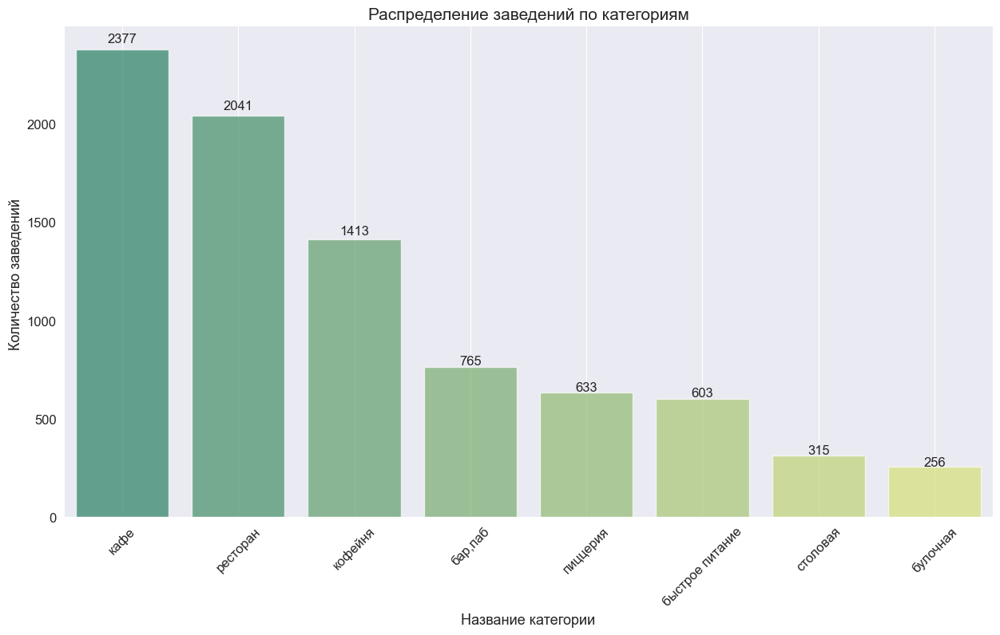

In [27]:
#постоим график распределения заведений по категориям
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x="category", y="count",
             data= df_category, alpha=0.7, palette='summer')
)
ax.set_title('Распределение заведений по категориям', size=15)
ax.set_xlabel('Название категории', size=13) 
ax.set_ylabel('Количество заведений ', size=13) 
plt.grid()
plt.xticks(rotation=45, size=12)
plt.yticks(size=12)

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

**Итоги:**

    1. В датафрейме представлено 8 уникальных категорий: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'.
    2. Cамые многочисленные категории:
        - кафе (2377 заведений)
        - ресторан (2041 заведений)
        - кофейня (1413 заведений)
    3. Самые малочисленные категории:
        - булочная (256 заведений)
        - столовая (315 заведений

### Зависимость количества посадочных мест от категорий <a class="anchor" id="cb-bullet"></a>

1. Исследуем количество посадочных мест в заведениях по категориям: рестораны, кофейни, пиццерии, бары и так далее.
2. Построим визуализации. 
3. Проанализируем результаты.

In [28]:
# таблица смедианным количеством посадочных мест по категориям
df_seats = df.pivot_table(index='category', values='seats', aggfunc='median').reset_index().sort_values(by='seats', ascending=False)
df_seats 

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


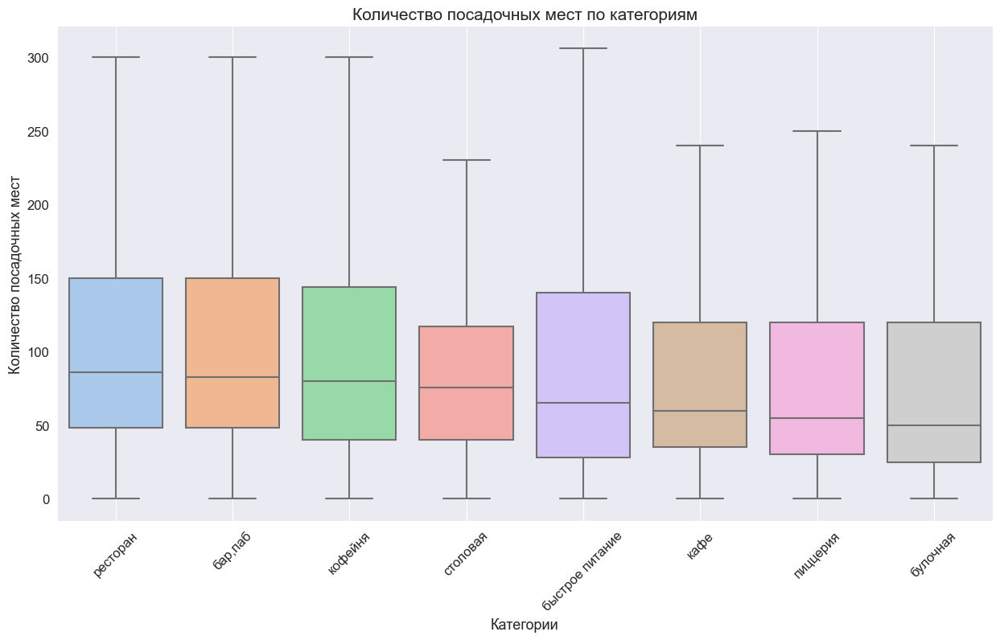

In [29]:
#посмотрим как распределены заведения в каждой категории по количеству посадочных мест
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')
ax= (
    sns
    .boxplot(x="category", y="seats",
             data= df, palette='pastel', order= df_seats.category , showfliers=False)
)
ax.set_title('Количество посадочных мест по категориям', size=15)
ax.set_xlabel('Категории', size=13) 
ax.set_ylabel('Количество посадочных мест', size=13) 
plt.grid()
plt.xticks(rotation=45, size=12)
plt.yticks(size=12)
plt.show()

По графику видно,

  - что самый небольшой диапозон посадочных мест в категории - Столовая. (большинство столовых имеют от 50 до 125 сидячих мест)
  - самый большй диапозон посадочных мест в категории - Быстрое питание (большинство таких заведений имеют от 25 до 150 сидячих мест)

Посмотрим поближе на медианные значения:


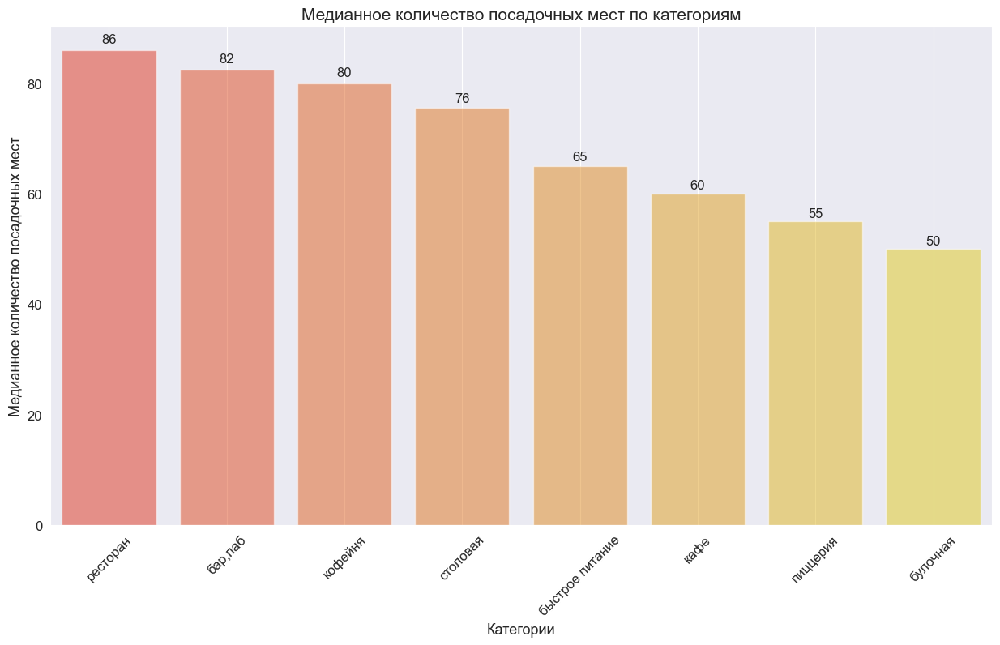

In [30]:
#график зависимости меедианного количества мест от категори
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='category', y='seats', data= df_seats , alpha=0.5, palette='autumn')
)
ax.set_title('Медианное количество посадочных мест по категориям', size=15)
ax.set_xlabel('Категории', size=13) 
ax.set_ylabel('Медианное количество посадочных мест', size=13) 
plt.grid()
plt.xticks(rotation=45, size=12)
plt.yticks(size=12)

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

**Итоги:**

    - самое большое медианное количество посадочных мест - в ресторанах (86), барах (82) и кофейнях (80).
    - самое маленькое медианное количество посадочных мест - в пиццериях (55) и булочных (50).

### Соотношение сетевых и несетевых заведений <a class="anchor" id="cc-bullet"></a>

Рассмотрим и визуализируем соотношение сетевых и несетевых заведений в датасете.

In [31]:
# Количесво сетевых и несетевых заведений
df_chain = df.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
df_chain

,chain,name
0,0,5198
1,1,3205


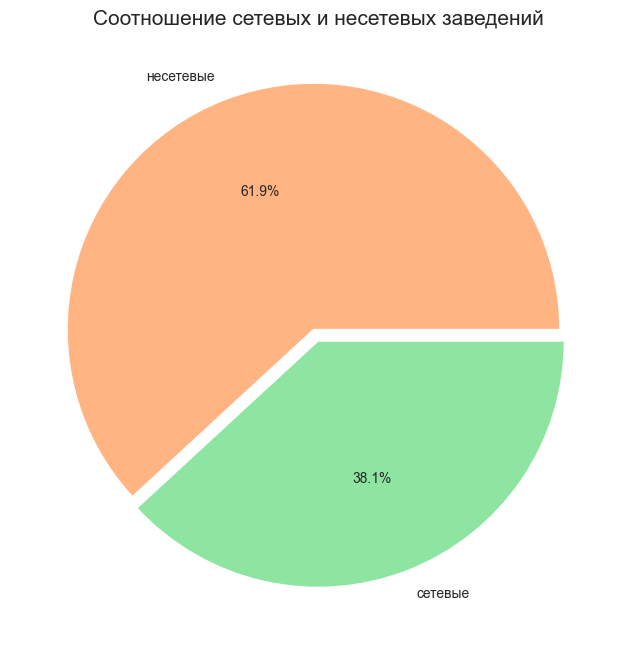

In [32]:
# создаем круговую диаграмму соотношения сетевых и несетевых заведений
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')
labels = ['несетевые', 'сетевые']
sns.set_style('darkgrid')
colors = sns.color_palette('pastel')[ 1:5 ]
explode = (0.05, 0)
plt.pie(df_chain['name'], labels = labels, autopct='%.1f%%', colors = colors, explode = explode)
plt.title('Соотношение сетевых и несетевых заведений', size=15)
plt.show()

Несетевых заведений (~ 62%) гораздо больше, чем сетевых (~ 38%).

Посмотрим, какие категории заведений чаще являются сетевыми. 

In [33]:
df_chain_by_category = (
    df[df['chain'] == 1]
    .pivot_table(index='category', values='chain', aggfunc='count')
    .reset_index()
    .sort_values(by='chain', ascending=False)
)
df_chain_by_category 

,category,chain
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


Сетевых кафе, ресторанов и кофеен гораздо больше, чем булочных и столовых. Но возможно это из-за того, что заведений этих категорий в принцепе больше. 

Нужно смотреть на доли сетевых заведений в каждой категории:

In [34]:
# создаем датафрейм с долей сетевых заведений в каждой категории
df_share_chain_by_category = (
    df
    .pivot_table(index='category', values='name', columns=['chain'], aggfunc='count')
    .reset_index()
)
df_share_chain_by_category.columns = ['category', 'not_chain', 'chain']

df_share_chain_by_category['share_chain'] = (
    
    df_share_chain_by_category['chain'] / 
    (df_share_chain_by_category['not_chain'] + df_share_chain_by_category['chain'])
)

df_share_chain_by_category = df_share_chain_by_category.sort_values(by='share_chain', ascending=False)

df_share_chain_by_category

,category,not_chain,chain,share_chain
1,булочная,99,157,0.613281
5,пиццерия,303,330,0.521327
4,кофейня,693,720,0.509554
2,быстрое питание,371,232,0.384743
6,ресторан,1311,730,0.357668
3,кафе,1598,779,0.327724
7,столовая,227,88,0.279365
0,"бар,паб",596,169,0.220915


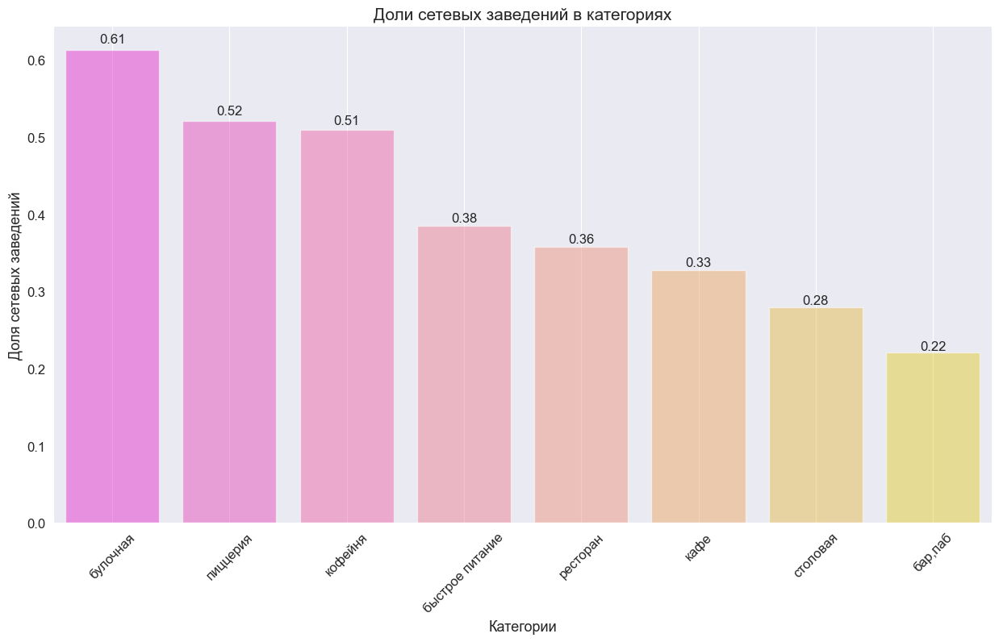

In [35]:
# визуализируем доли сетевых заведений для каждой категории
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='category', y='share_chain', data= df_share_chain_by_category , alpha=0.5, palette='spring')
)
ax.set_title('Доли сетевых заведений в категориях', size=15)
ax.set_xlabel('Категории', size=13) 
ax.set_ylabel('Доля сетевых заведений', size=13) 
plt.grid()
plt.xticks(rotation=45, size=12)
plt.yticks(size=12)

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.2f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

**Итоги:**
  
  1. Несетевых заведений (~ 62%) гораздо больше, чем сетевых (~ 38%).
  2. Наибольшая доля сетевых заведений в категориях:
        - булочная (61% сетевых заведений)
        - пиццерия (52%)
        - кофейня (51%)
  3. Наименьшая доля сетевых заведений:
        - бар/паб (22% сетевых заведений)
        - столовая (28%)

    

### ТОП-15 популярных сетей в Москве <a class="anchor" id="cd-bullet"></a>

1. Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 
2. Построим подходящую для такой информации визуализацию. 
3. Узнаем, есть ли какой-то признак, который их объединяет, и к какой категории заведений они относятся.

In [36]:
#топ-15 популярных сетей в Москве в разбивке по категориям
df_top_15 = (
    df[df['chain'] == 1]
    .groupby(['name', 'category'])['name']
    .count()
    .sort_values(ascending=False)
    .head(15)
    .to_frame()
)

df_top_15.columns = ['count']
df_top_15 = df_top_15.reset_index(level=0).reset_index(level=0)
df_top_15

,category,name,count
0,кофейня,шоколадница,119
1,пиццерия,домино'с пицца,76
2,пиццерия,додо пицца,74
3,кофейня,one price coffee,71
4,ресторан,яндекс лавка,69
5,кофейня,cofix,65
6,ресторан,prime,49
7,кофейня,кофепорт,42
8,кафе,кулинарная лавка братьев караваевых,39
9,ресторан,теремок,36


In [37]:
# Доля категорий в Топ-15 самых популярных сетевых заведений
df_top_15_category = (
    df_top_15
    .groupby('category', as_index=False)['count'].sum()
    .sort_values(by='count', ascending=False)
)
df_top_15_category['share'] = round(df_top_15_category['count'] / df_top_15_category['count'].sum(), 2)
df_top_15_category

,category,count,share
2,кофейня,350,0.46
4,ресторан,154,0.20
3,пиццерия,150,0.20
1,кафе,89,0.12
0,булочная,25,0.03


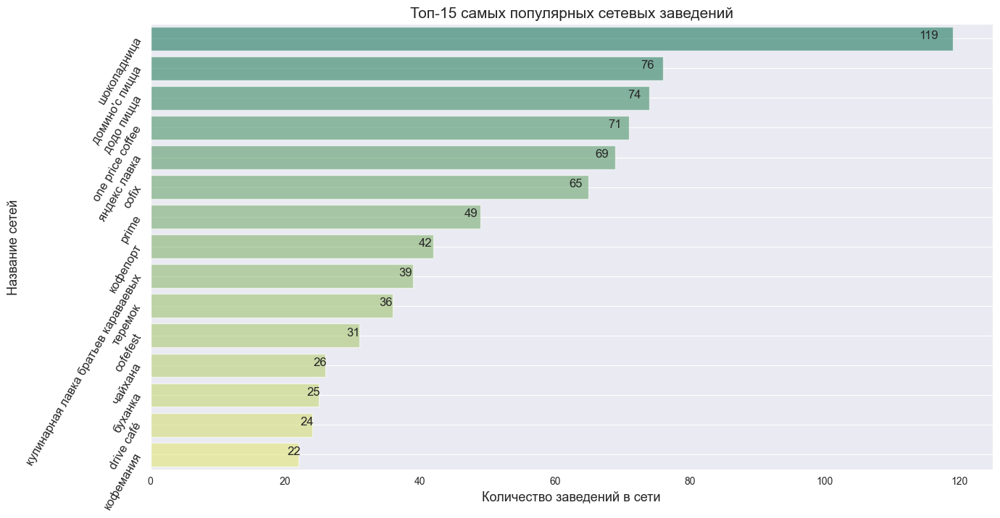

In [38]:
#Топ-15 самых популярных сетевых заведений
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='count', y='name', data= df_top_15 , alpha=0.6, palette='summer')
)
ax.set_title('Топ-15 самых популярных сетевых заведений', size=15)
ax.set_xlabel('Количество заведений в сети', size=13) 
ax.set_ylabel('Название сетей', size=13) 
plt.grid()
plt.yticks(rotation=60, size=12)
plt.yticks(size=12)

for i in ax.patches:
    _x = i.get_x() + i.get_width() + (i.get_width()*(-0.03))
    _y = i.get_y() + i.get_height() / 2
    value = '{:.0f}'.format(i.get_width())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

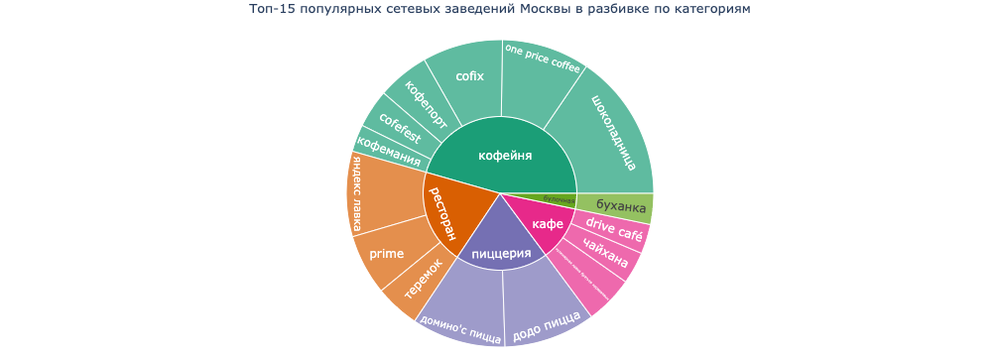

In [39]:
#топ-15 заведений в разбивке по категориям
fig = (
    px.sunburst(df_top_15, 
                path=['category', 'name'], 
                values='count', 
                color_discrete_sequence=px.colors.qualitative.Dark2)
)

fig.update_layout(
    title={
        'text': 'Топ-15 популярных сетевых заведений Москвы в разбивке по категориям',
        'y':0.99,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    margin=dict(l=0, r=0, t=40, b=10),
    titlefont=dict(size=13),
    width=1000
)
fig.show()

**Итоги:**
    Среди заведений из Топ-15 самых популярных сетей:
    
        - ~ 46% заведений - кофейни, причем самая популярная сеть - 'Шоколадница', 119 заведений
        - ~ 20% - рестораны, самая популярная сеть -  'Яндекс- лавка', 69 заведений 
        - ~ 20% - пиццерии, самая популярные сети - 'Додо пицца', 74 заведения и 'Домино'с пицца', 76 заведений
        - ~ 12% - кафе, самая популярная сеть -  'Кулинарная лавка братьев караваевых', 39 заведений
        - ~ 3% - булочные, самая популярная сеть -  'Буханка', 25 заведений

### Распределение заведений (категорий) по административным районам <a class="anchor" id="ce-bullet"></a>

1. Посмотрим, какие административные районы Москвы присутствуют в датасете.
2. Отобразим общее количество заведений и количество заведений каждой категории по районам. 
3. Проиллюстрируем эту информацию одним графиком.

In [40]:
#Уникальные названия административных районов
df.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [41]:
# Распределение заведений по административным округам
df_district = df.pivot_table(index='district', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
df_district

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,899
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


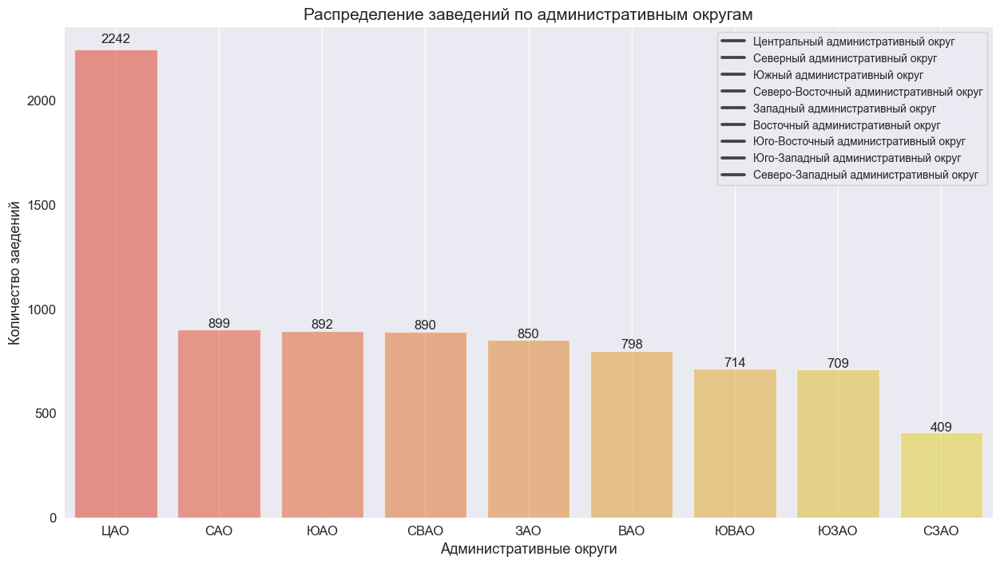

In [42]:
#Визуализируем распределение заведений по административным округам
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='district', y='name', data= df_district , alpha=0.5, palette='autumn')
)
ax.set_title('Распределение заведений по административным округам', size=15)
ax.set_xlabel('Административные округи', size=13) 
ax.set_ylabel('Количество заедений', size=13)
ax.set_xticklabels(['ЦАО','САО','ЮАО','СВАО','ЗАО','ВАО','ЮВАО','ЮЗАО', 'СЗАО'])
plt.grid()
plt.xticks(rotation=0, size=12)
plt.yticks(size=12)
ax.legend(df_district['district'])

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

1. Больше всего заведений в ЦАО (Центральном административном округе) - 2242 заведения, это более чем в два раза превышает количество заведений в любом другом округе. 
2. Меньше всего заведений в СЗАО (Северо-Западном административном округе) - 409.

In [43]:
# Распределение заведений по административным округам в разбивке по категориям
district_by_category = (
    df
    .groupby(['district', 'category'], as_index=False)['name'].count()
    .sort_values(by=['district', 'category'], ascending=False)
)
district_by_category

,district,category,name
71,Южный административный округ,столовая,44
70,Южный административный округ,ресторан,202
69,Южный административный округ,пиццерия,73
68,Южный административный округ,кофейня,131
67,Южный административный округ,кафе,264
...,...,...,...
4,Восточный административный округ,кофейня,105
3,Восточный административный округ,кафе,272
2,Восточный административный округ,быстрое питание,71
1,Восточный административный округ,булочная,25


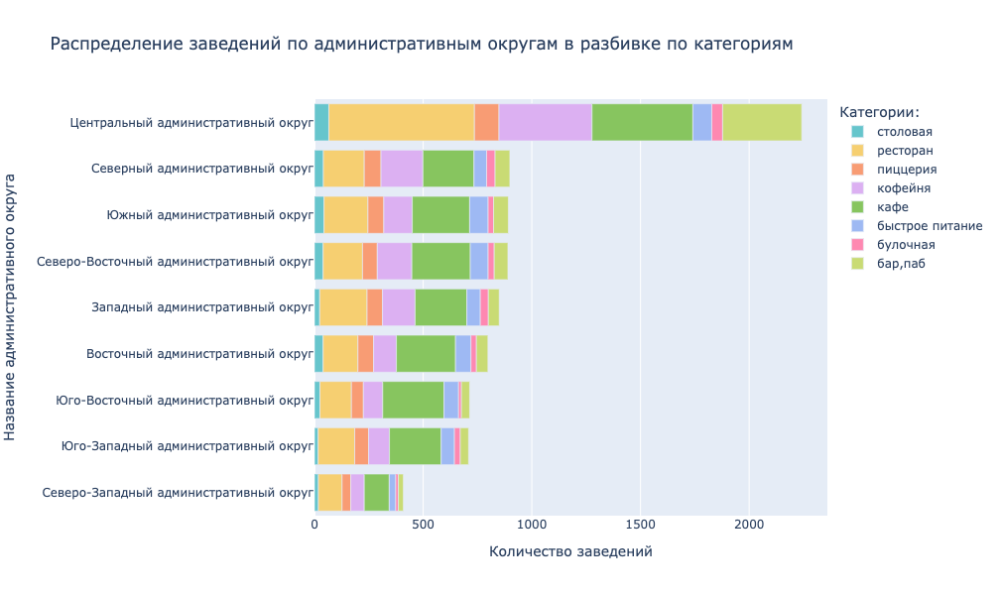

In [44]:
# Распределение заведений по административным округам в разбивке по категориям
fig = (
    px.bar(district_by_category, x=['name'], y="district", color="category",
           labels={
                     "value": "Количество заведений",
                     "district": "Название административного округа",
                     "category": "Категории:"
                 },
                title="Распределение заведений по административным округам в разбивке по категориям",\
                color_discrete_sequence=px.colors.qualitative.Pastel,\
                height= 600)
)
fig.update_traces(textfont_size=30, textangle=0)
fig.update_yaxes(categoryorder="total ascending")
fig.show()

**Итоги:**

    1. Больше всего заведений в ЦАО (Центральном административном округе) - 2242 заведения, это более чем в два раза привышает количество заведений в любом другом округе. 
    2. Меньше всего заведений в СЗАО (Северо-Западном административном округе) - 409.
    3. Что касается категорий, то:
        - ЦАО лидирует во всех категориях. В ЦАО:
        - более чем в три раза больше ресторанов, 
        - более чем в 2 раза больше кофеен 
        - более чем в 5 раз больше баров
        - почти в 2 раза больше кафе 
        чем в любом другом округе.
        - в ЦАО преобладают рестораны, тогда как в других округах - кафе.
    4. Во всех округах самыми популярными категориями являются:
        - рестораны, кафе и кофейни.

### Распределение средних рейтингов по категориям заведений <a class="anchor" id="cf-bullet"></a>

1. Визуализируем распределение средних рейтингов по категориям заведений. 
2. Посмотрим, различаются ли усреднённые рейтинги в разных типах общепита.

In [45]:
# Таблица со средним рейтингом заведений для каждой категории
df_rating_by_category = (
    df
    .pivot_table(index='category', values='rating', aggfunc='mean')
    .reset_index()
    .sort_values(by='rating', ascending=False)
)
df_rating_by_category

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290348
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123896
2,быстрое питание,4.050249


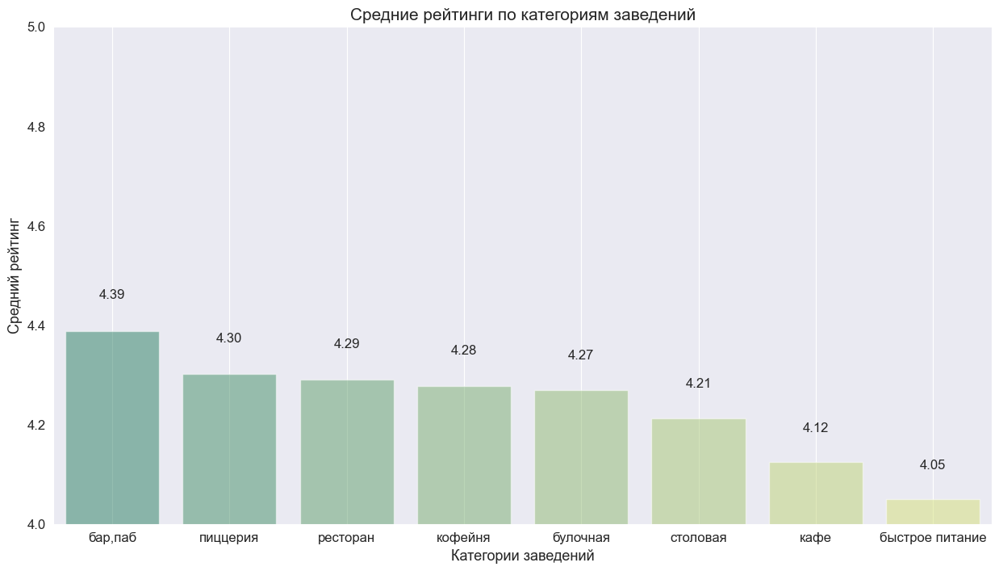

In [46]:
# визуализируем распределение средних рейтингов по категориям заведений
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='category', y='rating', data= df_rating_by_category , alpha=0.5, palette='summer')
)
ax.set_title('Средние рейтинги по категориям заведений', size=15)
ax.set_xlabel('Категории заведений', size=13) 
ax.set_ylabel('Средний рейтинг', size=13)
plt.grid()
plt.xticks(rotation=0, size=12)
plt.yticks(size=12)
plt.ylim([4, 5])

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.2f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

**Итоги:**

    - самый высокий средний рейтинг у пабов и баров (4.39)
    - самый назкий средний рейтинг у заведений быстрого питания (4.05)

### Картограмма со средним рейтингом заведений каждого района <a class="anchor" id="cg-bullet"></a>

1. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

2. Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [47]:
#формируем таблицу со средним рейтингом для кажого административного района
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239822
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [48]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

На карте отображаются границы округов Москвы, территория каждого из которых окрашена определенным цветом, отражающим средний рейтинг заведений в этом регионе.

    По карте видно, что
       - самый высокий средний рейтинг у ЦАО (Центрального административного округа)
       - самый низкий рейтинг у ЮВАО (Юго-Восточного административного округа)
    

In [49]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Выше представлена карта Москвы с маркерами заведений, нажав, на которые, можно посмотреть название и средний рейтинг заведения.

**Итоги:**

    - самый высокий средний рейтинг у ЦАО (Центрального административного округа)
    - самый низкий рейтинг у ЮВАО (Юго-Восточного административного округа) и СВАО (Северо-Восточного административного округа)
    - чем ближе к центру, тем плотность расположения заведений увеличивается.

### Топ-15 улиц по количеству заведений <a class="anchor" id="ch-bullet"></a>

1. Найдем топ-15 улиц по количеству заведений. 
2. Построим график распределения количества заведений и их категорий по этим улицам. 
3. Попробуем проиллюстрировать эту информацию одним графиком.

In [50]:
#формируем таблицу 15 самых популярных улиц с количеством заведений
df_top_streets = (
    df.groupby(['street'], as_index=False)['name']
    .count()
    .sort_values(by='name', ascending=False)
    .head(15)
    .reset_index()
    .drop(columns='index')
)
df_top_streets

,street,name
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [51]:
df_top_streets_by_category = (
    df.groupby(['street', 'category'], as_index=False)['name']
    .count()
    .sort_values(by='name', ascending=False)
    .reset_index()
    .drop(columns='index')
)

In [52]:
#формируем таблицу 15 самых популярных улиц с количеством заведений в разбивке по категориям
streets = df_top_streets['street'].values
df_top_streets_by_category = (
    df_top_streets_by_category
    .query('street in @streets')
    .sort_values(by='name', ascending=False)
)
df_top_streets_by_category = df_top_streets.merge(df_top_streets_by_category, how='inner', on='street').sort_values(by='name_x')
df_top_streets_by_category.columns = ['street', 'total_count', 'category', 'count_by_category'] 
df_top_streets_by_category

,street,total_count,category,count_by_category
110,Пятницкая улица,48,быстрое питание,2
104,Пятницкая улица,48,ресторан,18
105,Пятницкая улица,48,"бар,паб",9
109,Пятницкая улица,48,булочная,3
107,Пятницкая улица,48,кофейня,6
...,...,...,...,...
4,проспект Мира,183,"бар,паб",12
3,проспект Мира,183,быстрое питание,21
2,проспект Мира,183,кофейня,36
1,проспект Мира,183,ресторан,44


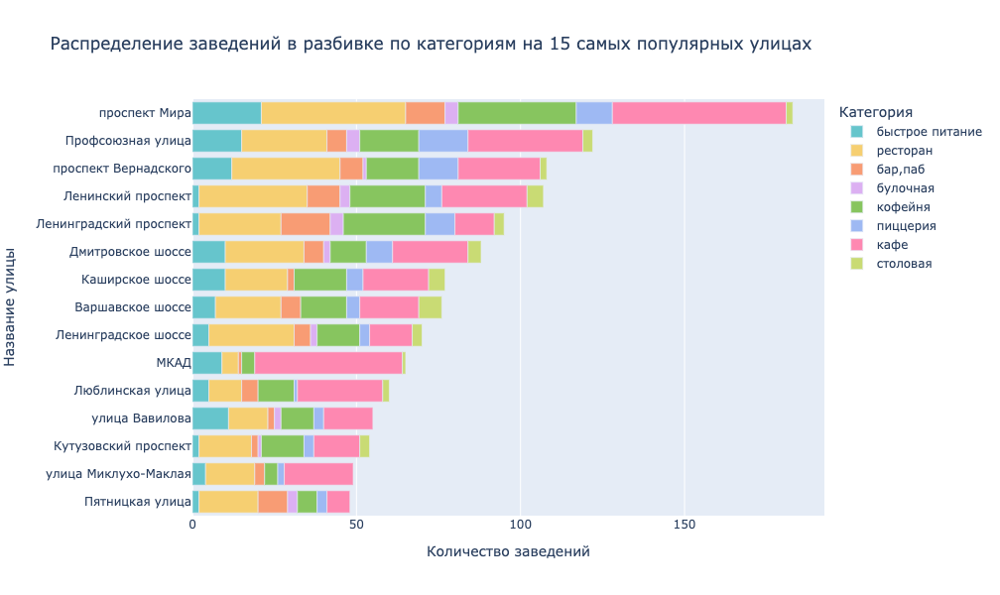

In [53]:
# Cтроим визуализацию 15 самых популярных улиц в разбивке по категориям
fig = (
    px.bar(df_top_streets_by_category, x=['count_by_category'], y="street", color="category",
           labels={
                     "value": "Количество заведений",
                     "street": "Название улицы",
                     "category": "Категория"
                 },
                title="Распределение заведений в разбивке по категориям на 15 самых популярных улицах",\
                color_discrete_sequence=px.colors.qualitative.Pastel,\
                height= 600)
)
fig.update_traces(textfont_size=30, textangle=0)
fig.update_xaxes(categoryorder="total descending")
fig.show()

**Итоги:**

Топ-15 самых популярных улиц (по количеству заведений):
    
    1.проспект Мира	(183 заведения) 
	2.Профсоюзная улица	(122 заведения)
	3.проспект Вернадского	(108 заведений)
	4.Ленинский проспект	(107 заведений)
	5.Ленинградский проспект	(95 заведений)
	6.Дмитровское шоссе	(88 заведений)
    7.Каширское шоссе	(77 заведений)
    8.Варшавское шоссе	(76 заведений)
    9.Ленинградское шоссе	(70 заведений)
	10.МКАД	65 заведений)
	11.Люблинская улица	(60 заведений)
	12.улица Вавилова	(55 заведений)
	13.Кутузовский проспект	(54 заведения)
	14.улица Миклухо-Маклая	(49 заведений)
	15.Пятницкая улица	(48 заведений)
    
- В основном для всех этих улиц можно назвать три самые многочисленные категории заведений: ресторан, кофейня и кафе.
- На Ленинградском проспекте довольно большую долю составляют бары, их больше, чем кафе.
- Так же на нескольких улицах в тройку категорий попадают заведения быстрого питания.

### Улицы с одним заведением <a class="anchor" id="ci-bullet"></a>

Найдём улицы, на которых находится только один объект общепита. 
Посмотрим, что можно сказать об этих заведениях.

In [54]:
non_public_streets = df.groupby('street', as_index=False)['name'].count().query('name == 1')['street'].values
print('Количество улиц с одним заведением', len(non_public_streets))

Количество улиц с одним заведением 458


Посмотрим, как эти улицы распределены по округам:

In [55]:
df_single_by_district = (
    df
    .query('street in @non_public_streets')
    .groupby(['district'], as_index=False)
    ['name'].count()
    .sort_values(by='name', ascending=False)
)
df_single_by_district

,district,name
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


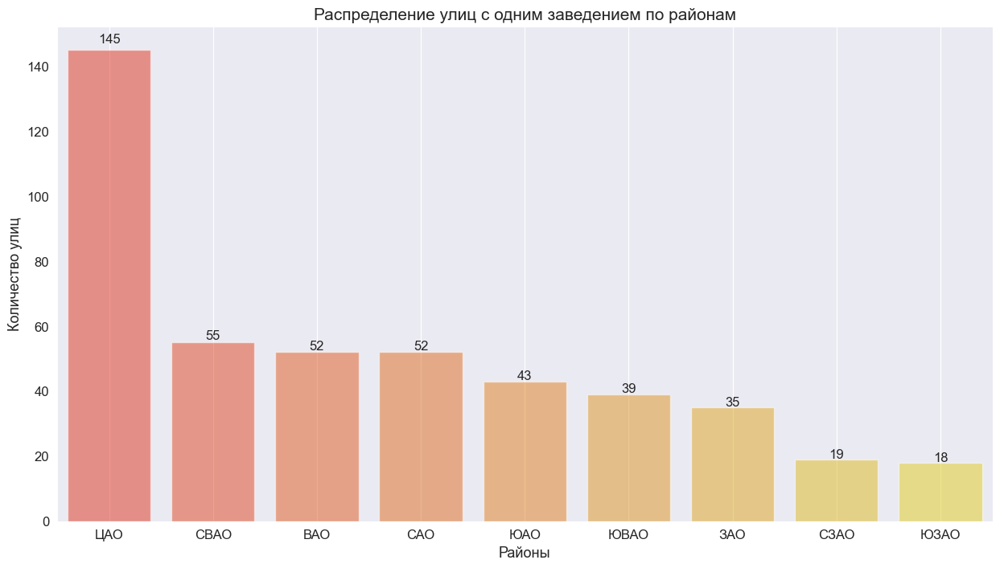

In [56]:
#постоим график распределения заведений по категориям
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x="district", y="name",
             data= df_single_by_district, alpha=0.5, palette='autumn')
)
ax.set_title('Распределение улиц с одним заведением по районам', size=15)
ax.set_xlabel('Районы', size=13) 
ax.set_ylabel('Количество улиц', size=13) 
plt.grid()
plt.xticks(rotation=0, size=12)
plt.yticks(size=12)
ax.set_xticklabels(['ЦАО','СВАО','ВАО','САО','ЮАО','ЮВАО','ЗАО','СЗАО', 'ЮЗАО'])

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

Больше всего улиц с одним заведением в Центральном административном округе.

Посмотрим на средний рейтинг этих заведений по регионам:

In [57]:
rating_single_by_district = (
    df
    .query('street in @non_public_streets')
    .groupby(['district'], as_index=False)
    ['rating'].mean()
    .sort_values(by='rating', ascending=False)
)
rating_by_district = rating_df.merge(rating_single_by_district, how='inner', on='district')
rating_by_district.columns= ['district', 'total_rating', 'single_rating']
rating_by_district

,district,total_rating,single_rating
0,Центральный административный округ,4.377520,4.422759
1,Северный административный округ,4.239822,4.244231
2,Северо-Западный административный округ,4.208802,4.278947
3,Южный административный округ,4.184417,4.090698
4,Западный административный округ,4.181647,4.048571
5,Восточный административный округ,4.174185,4.144231
6,Юго-Западный административный округ,4.172920,4.150000
7,Северо-Восточный административный округ,4.147978,4.158182
8,Юго-Восточный административный округ,4.101120,4.117949


In [58]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'single_rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Для ЦАО и СЗАО средний рейтинг единственных на улице заведений больше, чем средний рейтинг всех заведений.
- Для ЗАО наоборот, средний рейтинг единственных на улице заведений меньше, чем средний рейтинг всех заведений.

Посмотрим на распределение этих заведений по категориям:

In [59]:
df_single_by_category = (
    df
    .query('street in @non_public_streets')
    .groupby(['category'], as_index=False)
    ['name'].count()
    .sort_values(by='name', ascending=False)
)
df_single_by_category

,category,name
3,кафе,160
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


Распределение заведений-одиночек по категориям не сильно отличается от общего распределения по категориям.

**Итоги:**
   - Больше всего улиц с одним заведением в Центральном административном округе.
   - Для ЦАО средний рейтинг единственных на улице заведений больше, чем средний рейтинг всех заведений
   - Распределение заведений-одиночек по категориям не сильно отличается от  распределения всех заведений по категориям.
   Так же главенствуют три категории: кафе, ресторан, кофейня

### Зависимость среднего счета от удаленности от центра <a class="anchor" id="cj-bullet"></a>

1. Посчитаем медиану среднего чека для каждого района. 
2. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. 

In [60]:
#считаем медиану среднего чека для каждого округа
avg_bill_by_district = (
    df.groupby(['district'], as_index=False)['middle_avg_bill'].median()
    .sort_values(by='middle_avg_bill', ascending=False)
)
avg_bill_by_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [61]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    legend_name='Медианный счет заведений по районам',
).add_to(m)

# выводим карту
m

**Итоги:**

- самый высокий медианный средний чек в Центральном и Западном административных округах (1000 рублей)
- самые низкие в Северо-Восточном (500 рублей), Южном (500 рублей) и Южно-Восточном (450 рублей) округах.

Можно сделать вывод, что есть тенденция уменьшения среднего чека и среднего рейтинга заведений при удалении от центра.

### Зависимость часов работы заведений от категории и расположения <a class="anchor" id="ck-bullet"></a>

Посмотрим на доли круглосуточных заведений по категориям и округам:

In [62]:
#таблица отображающая доли круглосуточных заведений в категориях
category_24_7 = (
    df
    .groupby('category', as_index=False)['is_24_7']
    .mean()
    .sort_values(by='is_24_7', ascending=False)
)
category_24_7

,category,is_24_7
2,быстрое питание,0.248756
3,кафе,0.112326
1,булочная,0.093750
0,"бар,паб",0.067974
6,ресторан,0.066144
5,пиццерия,0.048973
4,кофейня,0.041755
7,столовая,0.038095


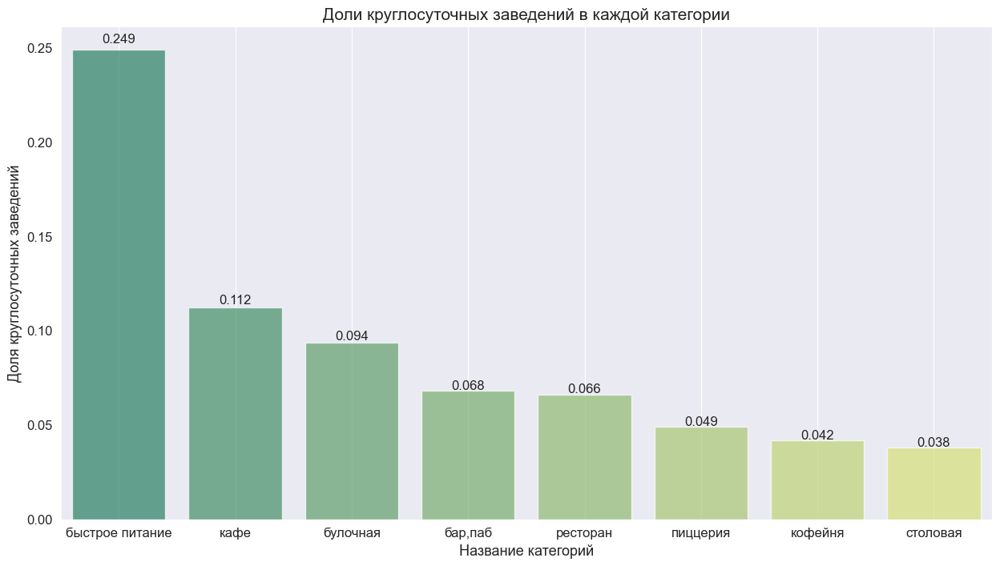

In [63]:
# Визуализируем доли круглосуточных заведений по категориям
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x='category', y='is_24_7', data= category_24_7 , alpha=0.7, palette='summer')
)
ax.set_title('Доли круглосуточных заведений в каждой категории', size=15)
ax.set_xlabel('Название категорий', size=13) 
ax.set_ylabel('Доля круглосуточных заведений', size=13)
plt.grid()
plt.xticks(rotation=0, size=12)
plt.yticks(size=12)

for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.3f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

- Самая большая доля круглосуточных заведений в категории быстрого питания - ~ 25%
- Самая маленькая доля круглосуточных заведений у кофеен и столовых - ~ 4%

In [64]:
#таблица отображающая доли круглосуточных заведений для каждого района
district_share_24_7 = (
    df
    .groupby('district', as_index=False)['is_24_7']
    .mean()
    .sort_values(by='is_24_7', ascending=False)
)
district_share_24_7

,district,is_24_7
6,Юго-Восточный административный округ,0.130252
0,Восточный административный округ,0.121554
4,Северо-Западный административный округ,0.105134
7,Юго-Западный административный округ,0.102962
1,Западный административный округ,0.084706
3,Северо-Восточный административный округ,0.084270
8,Южный административный округ,0.084081
2,Северный административный округ,0.078977
5,Центральный административный округ,0.058430


- Самые больший доли круглосуточных заведений у Юго-Восточного административного округа (13%) и Восточного административного округа (12%)
- Самая маленькая доля круглосуточных заведений в Центральном административном округе (5%)

In [65]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_share_24_7,
    columns=['district', 'is_24_7'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    legend_name='Доля круглосуточных заведений',
).add_to(m)

# выводим карту
m

**Итоги:**
    
Cамые большие доли круглосуточных заведений:
        
    1. в категории быстрого питания - ~ 25%
    2. в Юго-Восточном административном округе (13%) и Восточном административном округе (12%)
    
Cамые меленькие доли круглосуточных заведений:
        
    1. у кофеен и столовых - ~ 4%
    2. в Центральном административном округе (5%)
    

### Особенности заведений с низким рейтингом <a class="anchor" id="cl-bullet"></a>

In [66]:
#распределение данных по рейтингам
df.rating.describe()

count    8403.000000
mean        4.229894
std         0.470426
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Возьмем в качестве верхней границы низкого рейтинга - 4.1:

In [67]:
#таблица с долей заведений с низким рейтингом
low_rating_category = (
    df
    .query('rating < 4.1')
    .groupby('category', as_index = False)['name'].count()
    .sort_values(by='name', ascending=False)
)
low_rating_category = df_category.merge(low_rating_category, how='inner', on='category')
low_rating_category.columns = ['category', 'count', 'low_rating_count']
low_rating_category['share'] = low_rating_category['low_rating_count'] / low_rating_category['count']
low_rating_category.sort_values(by='share', ascending=False)

,category,count,low_rating_count,share
5,быстрое питание,603,222,0.368159
0,кафе,2377,717,0.301641
6,столовая,315,69,0.219048
7,булочная,256,41,0.160156
2,кофейня,1413,216,0.152866
1,ресторан,2041,282,0.138168
4,пиццерия,633,61,0.096367
3,"бар,паб",765,60,0.078431


- Самые большие доли заведений с низким рейтингом в категориях 'быстрое питание' (37%) и кафе (30%)
- Самая маленькая доля заведений с низким рейтингом в категории 'бар/паб' (8%)

Посмотрим как отлиячается средний чек по административным округам в заведениях с низким рейтингом от всех заведений:

In [68]:
#Таблица со медианным средним счетом по округам заведений с низким рейтингом
low_rating_avg_bill = (
    df
    .query('rating < 4.1')
    .groupby('district', as_index = False)['middle_avg_bill'].median()
    .sort_values(by='middle_avg_bill', ascending=False)
)
low_rating_avg_bill.columns = ['district', 'low_rating_avg_bill']
rating_avg_bill = low_rating_avg_bill.merge(avg_bill_by_district, how='inner', on='district') 
rating_avg_bill

,district,low_rating_avg_bill,middle_avg_bill
0,Центральный административный округ,525.0,1000.0
1,Западный административный округ,450.0,1000.0
2,Северный административный округ,400.0,650.0
3,Северо-Восточный административный округ,400.0,500.0
4,Южный административный округ,400.0,500.0
5,Восточный административный округ,375.0,575.0
6,Юго-Западный административный округ,350.0,600.0
7,Юго-Восточный административный округ,325.0,450.0
8,Северо-Западный административный округ,300.0,700.0


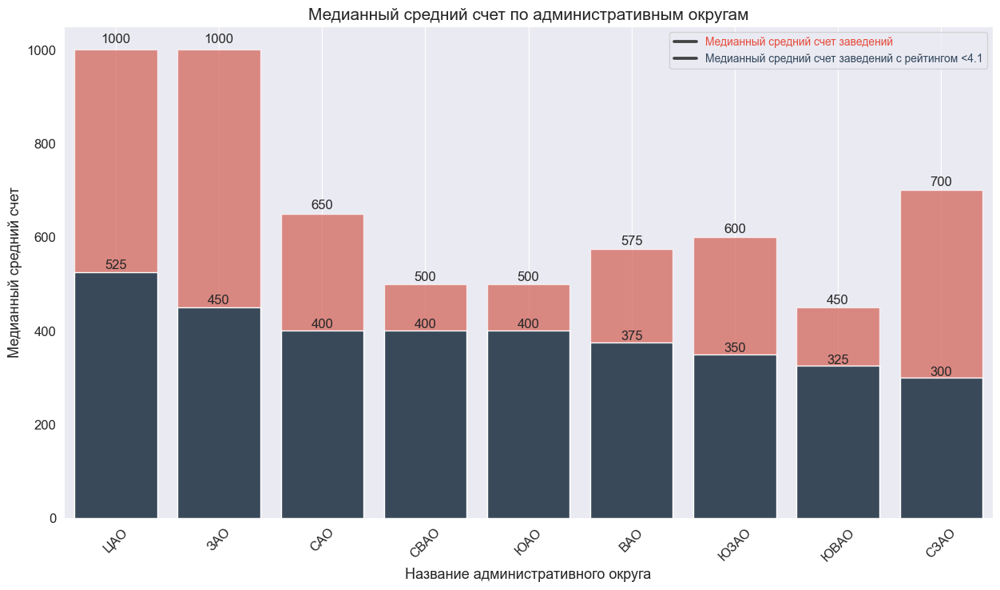

In [69]:
sns.set_style("darkgrid")

f, axes = plt.subplots(1,1, figsize=(15, 8), sharex=True, sharey=True) 

ax = (
    sns
    .barplot(x='district', y='middle_avg_bill', data= rating_avg_bill , alpha=0.7, ax=axes, color = "#e74c3c", label='spam')
)
bx= (
    sns
    .barplot(x='district', y='low_rating_avg_bill', data= rating_avg_bill , alpha=1, ax=axes, color = "#34495e", label='spam')
)
ax.set_title('Медианный средний счет по административным округам', size=15)
ax.set_xlabel('Название административного округа', size=13) 
ax.set_ylabel('Медианный средний счет', size=13)
plt.grid()
plt.xticks(rotation=45, size=12)
plt.yticks(size=12)
ax.legend(labels=['Медианный средний счет заведений', 'Медианный средний счет заведений с рейтингом <4.1'], labelcolor=["#e74c3c", "#34495e"])
ax.set_xticklabels(['ЦАО','ЗАО','САО','СВАО','ЮАО','ВАО','ЮЗАО','ЮВАО', 'СЗАО'])
for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

- Видно, что чем меньше рейтинг заведения, тем меньше медианный средний счет по округам.

- Например в Центральном административном округе, медианный средний чек у заведений с рейтингом < 4.1 в почти в два раза меньше, чем медианный средний чек по всем заведениям.

- Минимальная разница между медианным средним чеком по всем заведениям и медианным средним чеком по заведениям с рейтингом < 4.1  - в Северо-Восточном и Южном административных округах - 20%

**Итоги:** 
    
Взяв в качестве верхней границы низкого рейтинга - 4.1, было выявленно, что:

    1. Самые большие доли заведений с низким рейтингом в категориях 'быстрое питание' (37%) и кафе (30%)
    2. Самая маленькая доля заведений с низким рейтингом в категории 'бар/паб' (8%)
    3. Медианный средний чек заведений с низким рейтингом меньше для всех административных районов чем медианный средний чек по всем заведениям.

          - Например в Центральном административном округе, медианный средний чек у заведений с рейтингом < 4.1 в почти в два раза меньше, чем медианный средний чек по всем заведениям.

          - Минимальная разница между медианным средним чеком по всем заведениям и медианным средним чеком по заведениям с рейтингом < 4.1  - в Северо-Восточном и Южном административных округах - 20%
    

### Выводы по анализу рынка общественного питания <a class="anchor" id="cm-bullet"></a>

<div style="border:solid pink 3px; padding: 20px">


    
**В ходе проведения исследовательского анализа данных о заведениях общественного питания Москвы, были получены некоторые закономерности:**

**Распределение заведений по категориям:**
    
    1. В датафрейме представлено 8 уникальных категорий: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'.
    2. Cамые многочисленные категории:
        - кафе (2377 заведений)
        - ресторан (2041 заведений)
        - кофейня (1413 заведений)
    3. Самые малочисленные категории:
        - булочная (256 заведений)
        - столовая (315 заведений

**Зависимость количеста посадочных мест от категорий:**
    
        - самое большое медианное количество посадочных мест - в ресторанах (86), барах (82) и кофейнях (80).
        - самое маленькое медианное количество посадочных мест - в пиццериях (55) и булочных (50).
    
    Скорее всего посадочных мест больше в тех заведениях, где люди проводят больше времени.

**Соотношение сетевых и несетевых заведений:**
    
       1. Несетевых заведений (~ 62%) гораздо больше, чем сетевых (~ 38%).
       2. Наибольшая доля сетевых заведений в категориях:
            - булочная (61% сетевых заведений)
            - пиццерия (52%)
            - кофейня (51%)
       3. Наименьшая доля сетевых заведений:
            - бар/паб (22% сетевых заведений)
            - столовая (28%)
    
**ТОП-15 популярных сетей в Москве:**
           
    Среди заведений из Топ-15 самых популярных сетей:
    
        - ~ 46% заведений - кофейни, причем самая популярная сеть - 'Шоколадница', 119 заведений
        - ~ 20% - рестораны, самая популярная сеть -  'Яндекс- лавка', 69 заведений 
        - ~ 20% - пиццерии, самая популярные сети - 'Додо пицца', 74 заведения и 'Домино'с пицца', 76 заведений
        - ~ 12% - кафе, самая популярная сеть -  'Кулинарная лавка братьев караваевых', 39 заведений
        - ~ 3% - булочные, самая популярная сеть -  'Буханка', 25 заведений
    
**Распределение заведений по админстративным районам:**
        
        1. Больше всего заведений в ЦАО (Центральном административном округе) - 2242 заведения, это более чем в два раза привышает количество заведений в любом другом округе. 
        2. Меньше всего заведений в СЗАО (Северо-Западном административном округе) - 409.
        3. Что касается категорий, то:
              - ЦАО лидирует во всех категориях. В ЦАО:
              - более чем в три раза больше ресторанов, 
              - более чем в 2 раза больше кофеен 
              - более чем в 5 раз больше баров
              - почти в 2 раза больше кафе 
           чем в любом другом округе.
        4. Во всех округах самыми популярными категориями являются:
              - рестораны, кафе и кофейни.
    
**Зависимость средних рейтингов от категорий заведений:**
        
         - самый высокий средний рейтинг у пабов и баров (4.39)
         - самый назкий средний рейтинг у заведений быстрого питания (4.05)
    
**Зависимость средних рейтингов от местонахождения заведений:** 
    
         - самый высокий средний рейтинг у ЦАО (Центрального административного округа)
         - самый низкий рейтинг у ЮВАО (Юго-Восточного административного округа) и СВАО (Северо-Восточного административного округа)
         - чем ближе к центру, тем плотность расположения заведений увеличивается.
    
    
**ТОП-15 улиц, по количеству заведений:**
    
         1.проспект Мира	(183 заведения) 
	     2.Профсоюзная улица	(122 заведения)
	     3.проспект Вернадского	(108 заведений)
	     4.Ленинский проспект	(107 заведений)
	     5.Ленинградский проспект	(95 заведений)
	     6.Дмитровское шоссе	(88 заведений)
         7.Каширское шоссе	(77 заведений)
         8.Варшавское шоссе	(76 заведений)
         9.Ленинградское шоссе	(70 заведений)
	     10.МКАД	65 заведений)
	     11.Люблинская улица	(60 заведений)
	     12.улица Вавилова	(55 заведений)
	     13.Кутузовский проспект	(54 заведения)
	     14.улица Миклухо-Маклая	(49 заведений)
	     15.Пятницкая улица	(48 заведений)
    
         - В основном для всех этих улиц можно назвать три самые многочисленные категории заведений: ресторан, кофейня и кафе.
         - На Ленинградском проспекте довольно большую долю составляют бары, их больше, чем кафе.
         - Так же на нескольких улицах в тройку категорий попадают заведения быстрого питания.
         
    
**Исследование улиц с одним заведением:**
     
         - Больше всего улиц с одним заведением в Центральном административном округе.
         - Для ЦАО средний рейтинг единственных на улице заведений больше, чем средний рейтинг всех заведений
         - Распределение заведений-одиночек по категориям не сильно отличается от  распределения всех заведений по категориям.
           Так же главенствуют три категории: кафе, ресторан, кофейня

**Исследование круглосуточных заведений:**      
    
         - Cамые большие доли круглосуточных заведений:
        
               1. в категории быстрого питания - ~ 25%
               2. в Юго-Восточном административном округе (13%) и Восточном административном округе (12%)
    
         - Cамые меленькие доли круглосуточных заведений:
        
               1. у кофеен и столовых - ~ 4%
               2. в Центральном административном округе (5%)
    
    
**Зависимость среднего счета от удаленности от центра:**
         
          - самый высокий медианный средний чек в Центральном и Западном административных округах (1000 рублей)
          - самые низкие в Северо-Восточном (500 рублей), Южном (500 рублей) и Южно-Восточном (450 рублей) округах.

     Можно сделать вывод, что есть тенденция уменьшения среднего чека и среднего рейтинга заведений при удалении от центра.
    
    
**Особенности заведений с низким рейтингом:** 
    
 Взяв в качестве верхней границы низкого рейтинга - 4.1, было выявленно, что:

            1. Самые большие доли заведений с низким рейтингом в категориях 'быстрое питание' (37%) и кафе (30%)
            2. Самая маленькая доля заведений с низким рейтингом в категории 'бар/паб' (8%)
            3. Медианный средний чек заведений с низким рейтингом  меньше для всех административных районов чем медианный средний чек по всем заведениям.

          - в Центральном административном округе, медианный средний чек у заведений с рейтингом < 4.1 почти в два раза меньше, чем медианный средний чек по всем заведениям.

          - Минимальная разница между медианным средним чеком по всем заведениям и медианным средним чеком по заведениям с рейтингом < 4.1  - в Северо-Восточном и Южном административных округах - 20%
           

## Детализация исследования: Открытие кофейни <a class="anchor" id="d-bullet"></a>

Посмотрим, 

 - сколько всего кофеен в датасете.
 - в каких районах их больше всего

In [70]:
coffee_shops = df.query('category == "кофейня"')

coffee_shops.shape[0]

1413

In [71]:
print('Доля кофеен среди всех заведений общественного питания Москвы:', round(coffee_shops.shape[0]/ df.shape[0], 3))

Доля кофеен среди всех заведений общественного питания Москвы: 0.168


Всего в датасете 1413 кофеен.

In [72]:
#распределение кофеен по административным округам
coffee_shops_by_district = (
    coffee_shops
    .groupby('district', as_index=False)['name'].count()
    .sort_values(by='name', ascending=False)
)
coffee_shops_by_district

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [73]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= coffee_shops_by_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Количество кофеен',
).add_to(m)

# выводим карту
m

**- В Центральном административном округе (428 кофеен) более чем в два раза больше кофеен, чем в любом другом районе.**

**- На втором месте по количеству кофеен - Северный административный округ, здесь 193 кофейни.**

**- А вот меньше всего кофеен в Северо-Западном административном округе - всего лишь 62 кофейни.**

Посмотрим, есть ли круглосуточные кофейни:

In [74]:
print('Количество круглосуточных кофеен:',coffee_shops.query('is_24_7 == True')['name'].count())

Количество круглосуточных кофеен: 59


**Ранее я уже выяснила, лишь 4.17% кофеен - круглосуточные.**

Посмотрим, какие средние рейтинги имеют кофейни по районам:

In [75]:
print('Cредний рейтинг кофеен по всему датасету:', coffee_shops['rating'].mean())

Cредний рейтинг кофеен по всему датасету: 4.27728237791932


In [76]:
#расчитываем средние рейтинги кофеен по районам
rating_coffee_shops = coffee_shops.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_coffee_shops

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [77]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data= rating_coffee_shops,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Количество кофеен',
).add_to(m)

# выводим карту
m

ТОП 3 района по рейтингу кофеен:

    1. Центральный административный округ ~ 4.34
    2. Северо-Западный административный округ ~ 4.33
    3. Северный административный округ ~ 4.29

Минимальный средний рейтинг кофеен в Западном административном округе - ~ 4.19

**Посмотрим, на какую стоимость чашки кофе можно ориентироваться:**

In [78]:
#распределение стоимости чашки кофе по всему датасету: 
df.middle_coffee_cup.describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [79]:
#распределение стоимости чашки кофе по датасету с кофейнями: 
coffee_shops.middle_coffee_cup.describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Можно сделать вывод, что данные по другим категориям не сильно влияют на распределение стоимости чашки кофе.
- В среднем она стоит ~ 174-175 рублей.
- Медианная стоимость - ~ 169-170 рублей.

Будем ориентироваться на медианную стоимость, так как в данных присутствуют выбросы (максимальное значение стоимости чашки кофе - 1568 рублей, что несомненно странно).

Посмотрим на медианную стоимость чашки кофе по каждому району:

In [80]:
middle_coffee_cup_by_district = coffee_shops.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending=False)
middle_coffee_cup_by_district

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


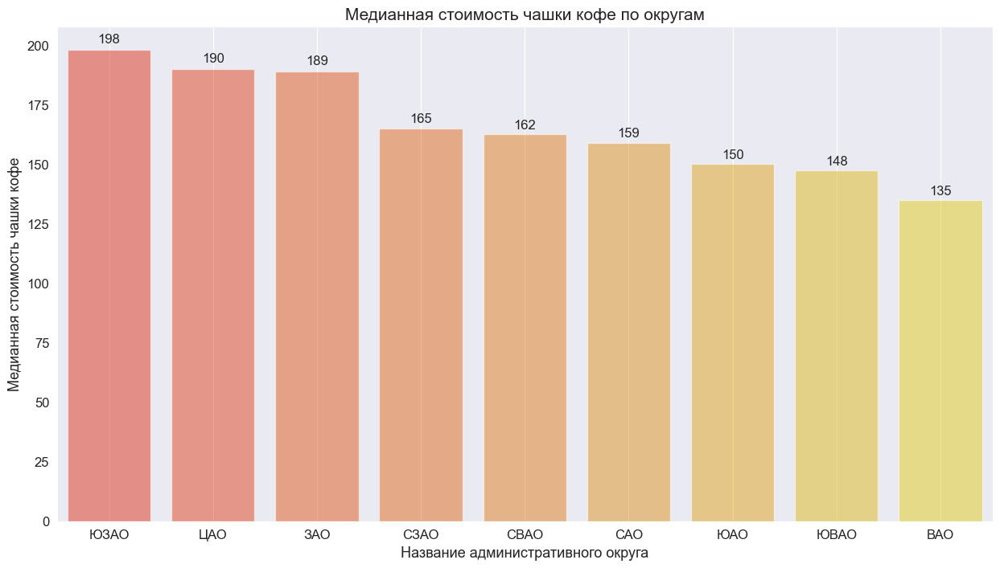

In [81]:
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

ax= (
    sns
    .barplot(x="district", y="middle_coffee_cup",
             data= middle_coffee_cup_by_district, alpha=0.5, palette='autumn')
)
ax.set_title('Медианная стоимость чашки кофе по округам', size=15)
ax.set_xlabel('Название административного округа', size=13) 
ax.set_ylabel('Медианная стоимость чашки кофе', size=13) 
plt.grid()
plt.xticks(rotation=0, size=12)
plt.yticks(size=12)
ax.set_xticklabels(['ЮЗАО','ЦАО','ЗАО','СЗАО','СВАО','САО','ЮАО','ЮВАО', 'ВАО'])
for i in ax.patches:
    _x = i.get_x() + i.get_width() / 2
    _y = i.get_y() + i.get_height() + (i.get_height()*0.015)
    value = '{:.0f}'.format(i.get_height())
    ax.text(_x, _y, value, ha="center", size=12)

plt.show()

Цена за чашку кофе в кофейне сильно зависит от района, где находится кофейня, то есть от стоимости покупки или аренды помещения, которая меняется от округа к округу. На это и стоит ориентироваться.

Так мы можем видеть, что
- В Юго-западном , Центральном  и Западном  администативных округах самые большие медианные чеки за чашку кофе.(198, 190 и 189 рублей). Эти районы имеют высокую стоимость аренды/ покупки помещений.
- А вот минимальная медианная стоимоть чашки кофе в Юго-Восточном и Восточном административном округе - 148 и 135 рублей. А в этих районах стоимость аренды/ покупки помещений гораздо меньше.


## Выводы и рекомендации по открытию кофейни <a class="anchor" id="e-bullet"></a>

<div style="border:solid pink 3px; padding: 20px">

**В качестве важных наблюдений и рекомендаций по открытию ковейни можно отметить:**

1. Кофейни входят в ТОП-3 самых многочисленных категорий заведений общественного питания в Москве

Всего кофеен в датасете - 1413, что составляет ~ 17% от всех заведений.

2. Лишь 4.17% кофеен - круглосуточные (59 кофеен), я не рекомендую открывать круглосуточную кофейню.

**3. Что касается распределения кофеен по административным округам, то:**

- В Центральном административном округе (428 кофеен) более чем в два раза больше кофеен, чем в любом другом районе.

- На втором месте по количеству кофеен - Северный административный округ, здесь 193 кофейни.**

- А вот меньше всего кофеен в Северо-Западном административном округе - всего лишь 62 кофейни.

**При этом, рассматривая средний рейтинг кофеен по округам, можно выявить ТОП-3 района:**

1. Центральный административный округ ~ 4.34
2. Северо-Западный административный округ ~ 4.33
3. Северный административный округ ~ 4.29

Минимальный средний рейтинг кофеен в Западном административном округе - ~ 4.19

**Цена за чашку кофе в кофейне сильно зависит от района, где находится кофейня, то есть от стоимости покупки или аренды помещения, которая меняется от округа к округу. На это и стоит ориентироваться.**

Так мы можем видеть, что
- В Юго-западном , Центральном  и Западном  администативных округах самые большие медианные чеки за чашку кофе.(198, 190 и 189 рублей). Эти районы имеют высокую стоимость аренды/ покупки помещений.

- А вот минимальная медианная стоимоть чашки кофе в Юго-Восточном и Восточном административном округе - 148 и 135 рублей. А в этих районах стоимость аренды/ покупки помещений гораздо меньше.


**Исходя из вышеперечисленных закономерностей, можно порекомендовать два района для открытия кофейни:**

- Центральный административный округ является безоговорочным лидером по количеству кофеен. Следовательно конкуренции там намного больше, чем в любом другом округе. Но и кофейни там востребованней. При этом этот район выигрывает и по среднему рейтингу кофеен. Но если отталкиваться от расходов на аренду/покупку помещения, то это менее выгодно, чем в любом другом районе. Нужно удивлять концепцией, подачей и качеством, так как аудитория ЦАО разбалована большим количеством кофеен, но зато она готова пить кофе и скорее всего более платежеспособна. Так же положительно влияет большое количество туристов.


- Так же можно присмотреться к Северо-заподному округу, так как там наименьшее количество кофеен среди округов. Но кофейни востребованны, так как средний рейтинг кофеен почти не отстает от рейтинга ЦАО. И медианная стоимость чашки кофе имеет средний показатель относительно других районов, что дает больший диапазон для выбора ценового-сегмента кофейни.


[**Вернуться к началу проекта**](#s-bullet)

## Создание презентации

Ссылка на презентацию:

https://drive.google.com/file/d/1O4dJ_4EXkl2juySfoOnmrHRoQZ8mDESH/view?usp=sharing